### Problem Statement:

This data was extracted from the 1994 Census bureau database by Ronny Kohavi and Barry Becker (Data Mining and Visualization, Silicon Graphics). A set of reasonably clean records was extracted using the following conditions: ((AAGE>16) && (AGI>100) && (AFNLWGT>1) && (HRSWK>0)). The prediction task is to determine whether a person makes over $50K a year.

Description of fnlwgt (final weight)
The weights on the Current Population Survey (CPS) files are controlled to independent estimates of the civilian non-institutional population of the US. These are prepared monthly for us by Population Division here at the Census Bureau. We use 3 sets of controls. These are:

A single cell estimate of the population 16+ for each state.

Controls for Hispanic Origin by age and sex.

Controls by Race, age and sex.

We use all three sets of controls in our weighting program and "rake" through them 6 times so that by the end we come back to all the controls we used. The term estimate refers to population totals derived from CPS by creating "weighted tallies" of any specified socio-economic characteristics of the population. People with similar demographic characteristics should have similar weights. There is one important caveat to remember about this statement. That is that since the CPS sample is actually a collection of 51 state samples, each with its own probability of selection, the statement only applies within state.

In [1]:
#Importing libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix, classification_report 
from sklearn.model_selection import train_test_split
from scipy.stats import zscore #to remove outliers
from scipy.stats import skew
import requests
import pandas_profiling
import io
import warnings
warnings.filterwarnings('ignore')

In [3]:
#Importing dataset

In [4]:
df = pd.read_csv("census_income.csv")

# eda

In [5]:
df.head(8)

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
5,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
6,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
7,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K


In [6]:
df.shape # check the data dimension

(32560, 15)

In [7]:
df.dtypes

Age                int64
Workclass         object
Fnlwgt             int64
Education         object
Education_num      int64
Marital_status    object
Occupation        object
Relationship      object
Race              object
Sex               object
Capital_gain       int64
Capital_loss       int64
Hours_per_week     int64
Native_country    object
Income            object
dtype: object

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [9]:
df.columns # check the column names for EDA

Index(['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income'],
      dtype='object')

In [10]:
df.describe()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [ ]:
#Object type columns are:

#'Workclass','Education','Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex','Hours_per_week', 'Native_country'
#'Income'                  

In [11]:
df['Workclass'].nunique()

9

In [12]:
df['Education'].nunique()

16

In [13]:
df['Marital_status'].nunique()

7

In [14]:
df['Occupation'].nunique()

15

In [15]:
df['Relationship'].nunique()

6

In [16]:
df['Race'].nunique()

5

In [17]:
df['Sex'].nunique()

2

In [18]:
df['Hours_per_week'].nunique()

94

In [19]:
df['Native_country'].nunique()

42

In [20]:
df['Income'].nunique()

2

In [ ]:
#Above analysis helps us to understnad that Hours_per_week column is already an integer and we should apply labelencoder
#Rather we should change the datatype from str to integer for this column

In [21]:
df[['Hours_per_week']] = df[['Hours_per_week']].apply(pd.to_numeric)

In [22]:
df['Hours_per_week'].dtype

dtype('int64')

In [ ]:
#Changing categorical data into numeric data for other columns

In [23]:
from sklearn.preprocessing import LabelEncoder

# creating instance of labelencoder
labelencoder = LabelEncoder()
# Assigning numerical values and storing in another column
df['Workclass'] = labelencoder.fit_transform(df['Workclass'])
df['Education'] = labelencoder.fit_transform(df['Education'])
df['Marital_status'] = labelencoder.fit_transform(df['Marital_status'])
df['Occupation'] = labelencoder.fit_transform(df['Occupation'])
df['Relationship'] = labelencoder.fit_transform(df['Relationship'])
df['Race'] = labelencoder.fit_transform(df['Race'])
df['Sex'] = labelencoder.fit_transform(df['Sex'])
df['Native_country'] = labelencoder.fit_transform(df['Native_country'])
df['Income'] = labelencoder.fit_transform(df['Income'])

df

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,6,83311,9,13,2,4,0,4,1,0,0,13,39,0
1,38,4,215646,11,9,0,6,1,4,1,0,0,40,39,0
2,53,4,234721,1,7,2,6,0,2,1,0,0,40,39,0
3,28,4,338409,9,13,2,10,5,2,0,0,0,40,5,0
4,37,4,284582,12,14,2,4,5,4,0,0,0,40,39,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,4,257302,7,12,2,13,5,4,0,0,0,38,39,0
32556,40,4,154374,11,9,2,7,0,4,1,0,0,40,39,1
32557,58,4,151910,11,9,6,1,4,4,0,0,0,40,39,0
32558,22,4,201490,11,9,4,1,3,4,1,0,0,20,39,0


In [25]:
df['Income'].nunique()

2

## handle null values

In [33]:
df.isna().sum() #checked for null values, there are no null values in the dataset

Age               0
Workclass         0
Fnlwgt            0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

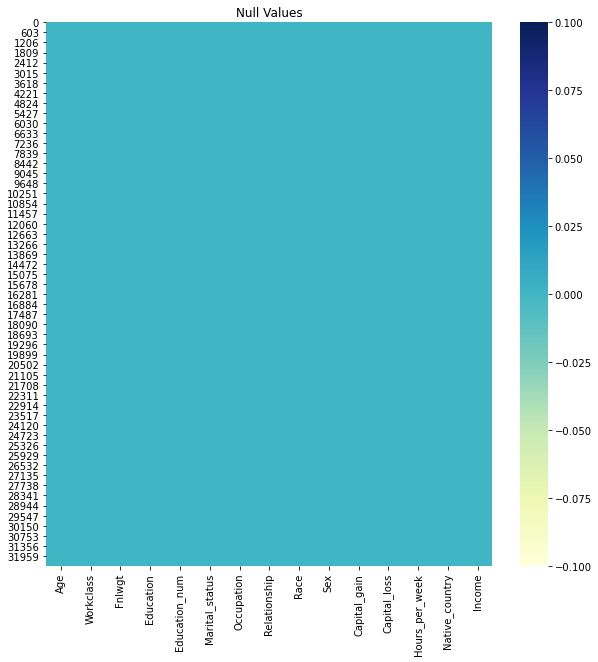

In [34]:
plt.figure(figsize = (10,10))
sns.heatmap(df.isnull(),cmap="YlGnBu")
plt.title("Null Values")
plt.show()

Age


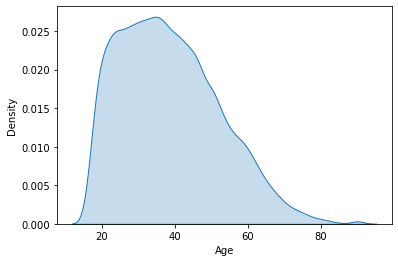

Workclass


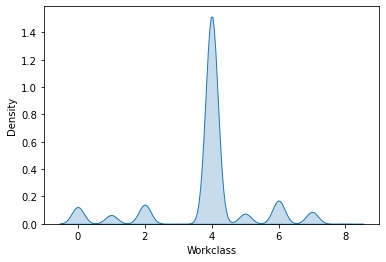

Fnlwgt


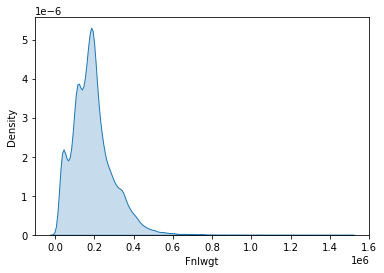

Education


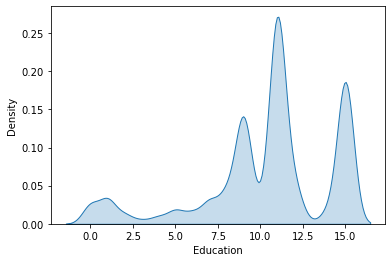

Education_num


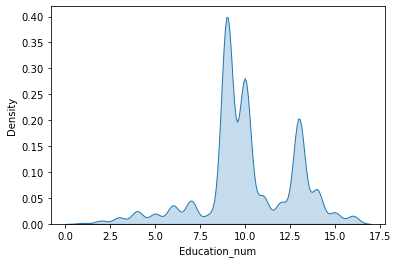

Marital_status


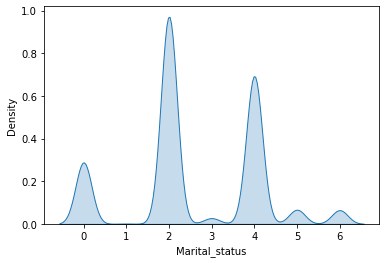

Occupation


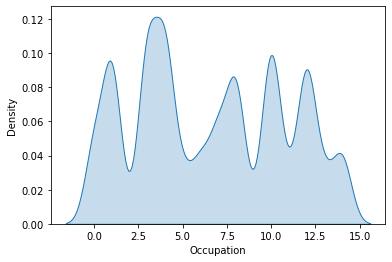

Relationship


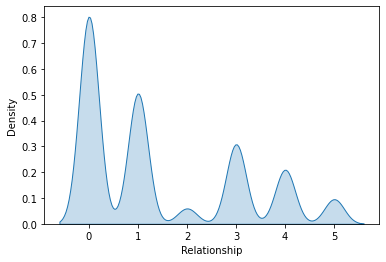

Race


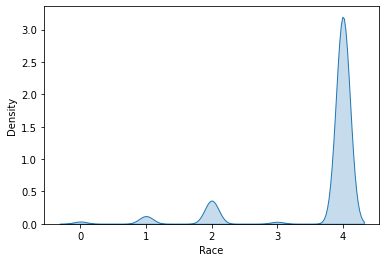

Sex


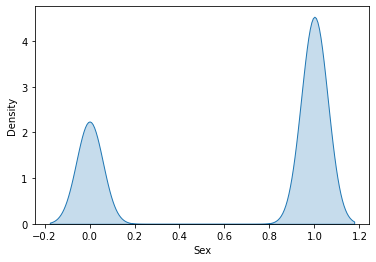

Capital_gain


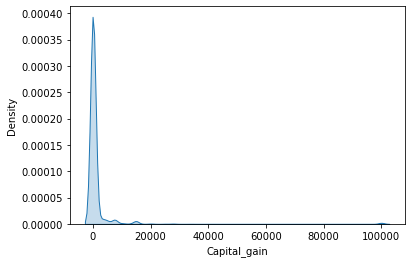

Capital_loss


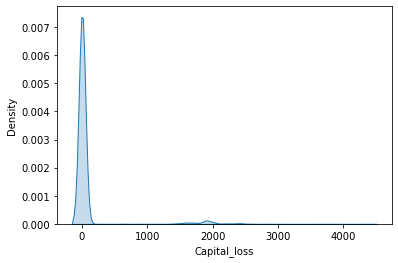

Hours_per_week


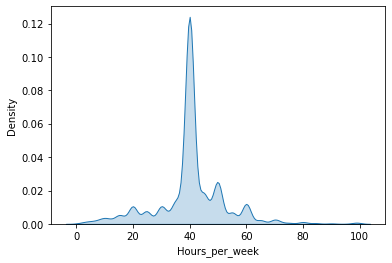

Native_country


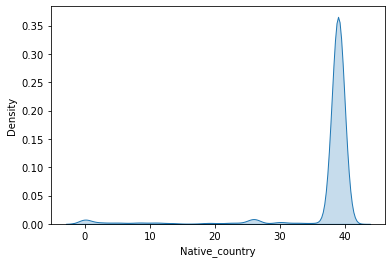

Income


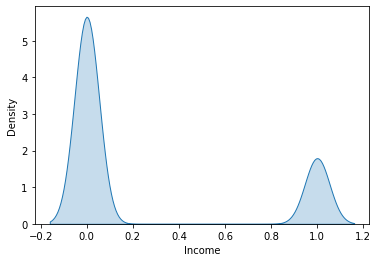

In [35]:
for col in df:
    print(col)
    
    plt.figure()
    sns.kdeplot(df[col], shade = True)
    plt.show()

In [36]:
#Dataset is imbalanced

In [37]:
df.columns

Index(['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income'],
      dtype='object')

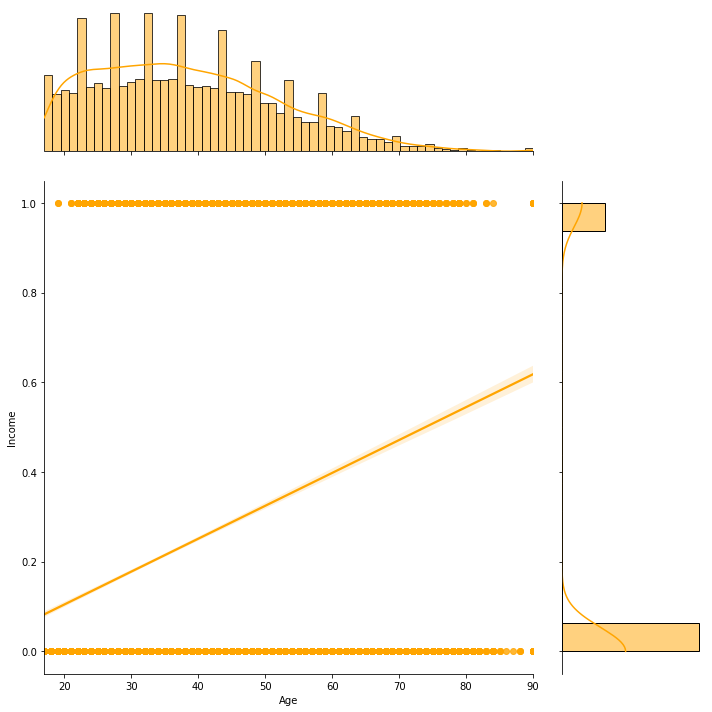

In [38]:
sns.jointplot(x="Age", y="Income",  data=df, height=10, ratio=3, color="orange", kind = "reg")
plt.show()

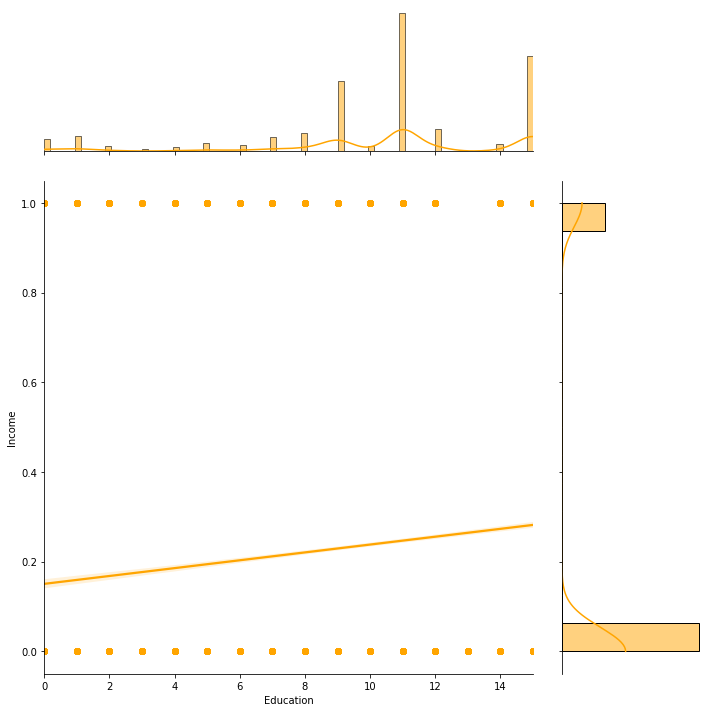

In [39]:
sns.jointplot(x="Education", y="Income",  data=df, height=10, ratio=3, color="orange", kind = "reg")
plt.show()

In [42]:
pre_profile = df.profile_report(title="Census Income")

In [43]:
pre_profile

## check for outliers

In [44]:
#remove outliers before skewness check and before x, y split

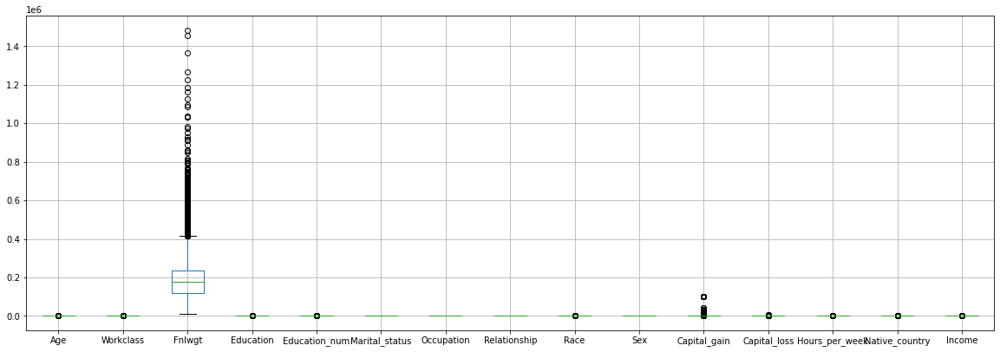

In [45]:
df.boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

In [46]:
#Removing outliers by z score

In [47]:
from scipy.stats import zscore
z = np.abs(zscore(df))
new_df = df[(z<3).all(axis=1)]

In [48]:
new_df.shape

(27417, 15)

In [49]:
df.shape

(32560, 15)

In [51]:
dataloss = ((32560-27417)/32560)*100

In [52]:
dataloss

15.795454545454547

In [53]:
#Outliers are not removed since data loss is more than 7%.

## check co-relation

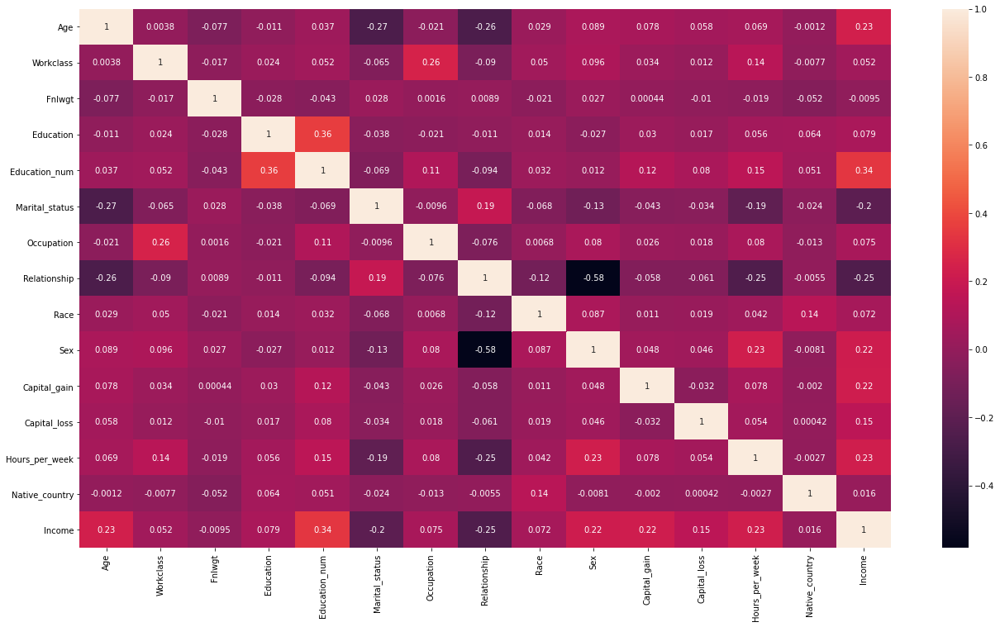

In [54]:
plt.figure(figsize=[22,12])
cor = df.corr()
sns.heatmap(cor, annot = True)
plt.show()

In [ ]:
#Arrange co-relation in descending order. Dropping columns should be the last option to prevent data loss.

In [55]:
cor['Income'].sort_values(ascending=False)

Income            1.000000
Education_num     0.335182
Age               0.234039
Hours_per_week    0.229690
Capital_gain      0.223333
Sex               0.215995
Capital_loss      0.150523
Education         0.079311
Occupation        0.075448
Race              0.071853
Workclass         0.051645
Native_country    0.015845
Fnlwgt           -0.009481
Marital_status   -0.199295
Relationship     -0.250924
Name: Income, dtype: float64

In [56]:
df.columns

Index(['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income'],
      dtype='object')

In [57]:
columns = ['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income']

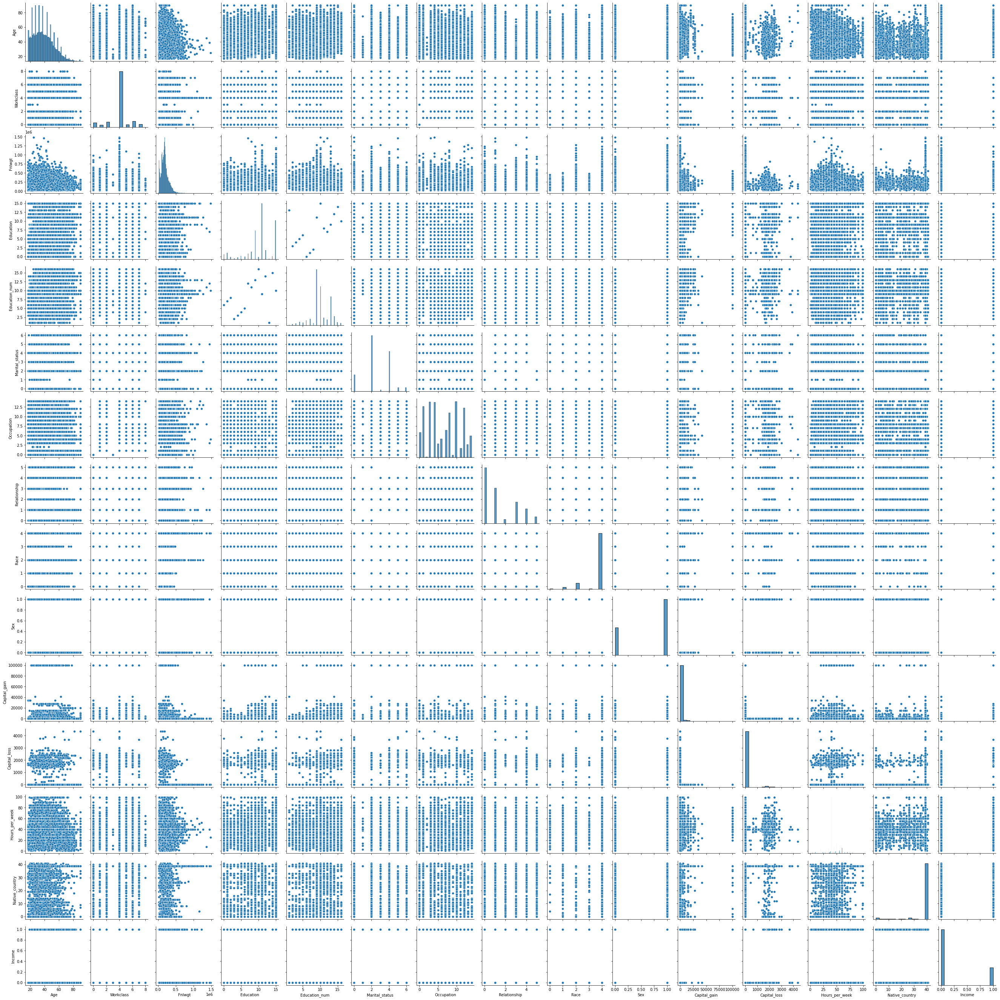

In [58]:
sns.pairplot(df[columns])

## check for skewness

In [59]:
x = df.drop('Income',axis=1)
y = df['Income']

In [60]:
x.skew() # check skewness

Age                0.558738
Workclass         -0.752280
Fnlwgt             1.446972
Education         -0.934063
Education_num     -0.311630
Marital_status    -0.013448
Occupation         0.114540
Relationship       0.786784
Race              -2.435332
Sex               -0.719244
Capital_gain      11.953690
Capital_loss       4.594549
Hours_per_week     0.227636
Native_country    -3.658235
dtype: float64

In [61]:
from sklearn.preprocessing import power_transform
df_new = power_transform(x)

df_new = pd.DataFrame(df_new, columns = x.columns)

In [62]:
df_new.skew()

Age              -0.013897
Workclass         0.061629
Fnlwgt            0.016914
Education        -0.309431
Education_num     0.023885
Marital_status   -0.114201
Occupation       -0.187152
Relationship      0.122917
Race             -2.010817
Sex              -0.719244
Capital_gain      3.016951
Capital_loss      4.299511
Hours_per_week    0.229556
Native_country   -2.725467
dtype: float64

In [63]:
x = df_new

## find best random state

In [64]:
#for classification problems

In [65]:
from sklearn.linear_model import LogisticRegression
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=.30, random_state = i)
    LR = LogisticRegression()
    LR.fit(x_train, y_train)
    predLR = LR.predict(x_test)
    acc = accuracy_score(y_test, predLR)
    if acc>maxAccu:
        maxAccu = acc
        maxRS=i
print("Best accuracy is", maxAccu," on Random State ",maxRS)

Best accuracy is 0.8354832104832105  on Random State  109


In [ ]:
#We have found the best random state. We will create our train_test_split using this random state.

## test train split

In [66]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=109)

## handle data imbalance

<AxesSubplot:xlabel='Income', ylabel='count'>

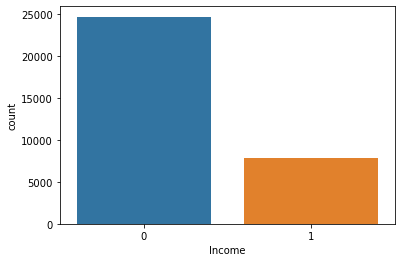

In [67]:
sns.countplot(df['Income'])

In [68]:
y.value_counts()

0    24719
1     7841
Name: Income, dtype: int64

In [69]:
!pip install imbalanced_learn
!pip install delayed

In [70]:
from imblearn.over_sampling import SMOTE
oversample=SMOTE(k_neighbors=4)
#transform the dataset
x,y=oversample.fit_resample(x,y)

In [71]:
y.value_counts()

1    24719
0    24719
Name: Income, dtype: int64

### classification 

In [72]:
#logistic_regression

In [73]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(x_train, y_train)
predlr = LR.predict(x_test)

print(accuracy_score(y_test,predlr))
print(confusion_matrix(y_test,predlr))
print(classification_report(y_test,predlr))

0.8354832104832105
[[7060  446]
 [1161 1101]]
              precision    recall  f1-score   support

           0       0.86      0.94      0.90      7506
           1       0.71      0.49      0.58      2262

    accuracy                           0.84      9768
   macro avg       0.79      0.71      0.74      9768
weighted avg       0.82      0.84      0.82      9768



In [74]:
#support vector machines 

In [75]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(x_train,y_train)
predsvc = svc.predict(x_test)

print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.8426494676494677
[[7053  453]
 [1084 1178]]
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      7506
           1       0.72      0.52      0.61      2262

    accuracy                           0.84      9768
   macro avg       0.79      0.73      0.75      9768
weighted avg       0.83      0.84      0.83      9768



In [76]:
#decisiontree 

In [77]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)
preddt = dt.predict(x_test)

print(accuracy_score(y_test,preddt))
print(classification_report(y_test,preddt))
print(confusion_matrix(y_test,preddt))

0.8033374283374284
              precision    recall  f1-score   support

           0       0.88      0.87      0.87      7506
           1       0.57      0.60      0.58      2262

    accuracy                           0.80      9768
   macro avg       0.72      0.73      0.73      9768
weighted avg       0.81      0.80      0.80      9768

[[6498 1008]
 [ 913 1349]]


In [78]:
#random forest 

In [79]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=1000)
rf.fit(x_train,y_train)
predrf = rf.predict(x_test)

print(accuracy_score(y_test,predrf))
print(classification_report(y_test,predrf))
print(confusion_matrix(y_test,predrf))

0.8553439803439803
              precision    recall  f1-score   support

           0       0.89      0.93      0.91      7506
           1       0.72      0.62      0.67      2262

    accuracy                           0.86      9768
   macro avg       0.80      0.77      0.79      9768
weighted avg       0.85      0.86      0.85      9768

[[6950  556]
 [ 857 1405]]


## check cross-validation scores

In [80]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(LR, x, y, cv=5)
print("CrossValidation Score of LogisticRegression Model: ", scr.mean())

CrossValidation Score of LogisticRegression Model:  0.7775599713657535


In [81]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(dt, x, y, cv=5)
print("CrossValidation Score of DecisionTree Model: ", scr.mean())

CrossValidation Score of DecisionTree Model:  0.8483569840819382


In [82]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(rf, x, y, cv=5)
print("CrossValidation Score of RandomForest Model: ", scr.mean())

CrossValidation Score of RandomForest Model:  0.8998959991430674


In [83]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(svc, x, y, cv=5)
print("CrossValidation Score of SVC Model: ", scr.mean())

CrossValidation Score of SVC Model:  0.8256605978462778


In [84]:
#Model with least difference between Model accuracy and cross validation is selected as the best model
#LR ->  
83.5 - 77.7

5.799999999999997

In [85]:
# SVM -> 
84.2 - 82.6

1.6000000000000085

In [86]:
# DT -> 
80.3 - 84.8

-4.5

In [87]:
# RF -> 
85.5 - 89.9 

-4.400000000000006

## hyper parameter tuning

In [88]:
### Manual Hyperparameter Tuning
model=RandomForestClassifier(n_estimators=300,criterion='entropy',max_features='sqrt',min_samples_leaf=10,random_state=100).fit(x_train,y_train)
predictions=model.predict(x_test)
print(confusion_matrix(y_test,predictions))
print(accuracy_score(y_test,predictions))
print(classification_report(y_test,predictions))

[[7102  404]
 [ 948 1314]]
0.8615888615888616
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      7506
           1       0.76      0.58      0.66      2262

    accuracy                           0.86      9768
   macro avg       0.82      0.76      0.79      9768
weighted avg       0.86      0.86      0.85      9768



In [89]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [90]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(x_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=100, verbose=2)

In [91]:
rf_randomcv.best_params_

{'n_estimators': 400,
 'min_samples_split': 14,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 670,
 'criterion': 'gini'}

In [92]:
rf_randomcv

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=100, verbose=2)

In [93]:
best_random_grid=rf_randomcv.best_estimator_

In [94]:
from sklearn.metrics import accuracy_score
y_pred=best_random_grid.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[7071  435]
 [ 880 1382]]
Accuracy Score 0.8653767403767404
Classification report:               precision    recall  f1-score   support

           0       0.89      0.94      0.91      7506
           1       0.76      0.61      0.68      2262

    accuracy                           0.87      9768
   macro avg       0.82      0.78      0.80      9768
weighted avg       0.86      0.87      0.86      9768



## Grid Search CV

In [95]:
rf_randomcv.best_params_

{'n_estimators': 400,
 'min_samples_split': 14,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 670,
 'criterion': 'gini'}

In [96]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['gini'], 'max_depth': [670], 'max_features': ['sqrt'], 'min_samples_leaf': [2, 4, 6], 'min_samples_split': [12, 13, 14, 15, 16], 'n_estimators': [200, 300, 400, 500, 600]}


In [97]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(x_train,y_train)

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [670],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [2, 4, 6],
                         'min_samples_split': [12, 13, 14, 15, 16],
                         'n_estimators': [200, 300, 400, 500, 600]},
             verbose=2)

In [98]:
grid_search.best_estimator_

RandomForestClassifier(max_depth=670, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=14, n_estimators=600)

In [99]:
best_grid=grid_search.best_estimator_

In [100]:
best_grid

RandomForestClassifier(max_depth=670, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=14, n_estimators=600)

In [101]:
y_pred=best_grid.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[7065  441]
 [ 895 1367]]
Accuracy Score 0.8632268632268633
Classification report:               precision    recall  f1-score   support

           0       0.89      0.94      0.91      7506
           1       0.76      0.60      0.67      2262

    accuracy                           0.86      9768
   macro avg       0.82      0.77      0.79      9768
weighted avg       0.86      0.86      0.86      9768



## saving the model

In [ ]:
import joblib
joblib.dump(best_grid, "model.pkl") #rename as per project name
prediction = model.predict(x_test)